# **Ninjacart: CV_Classification**
Ninjacart, India’s leading fresh produce supply chain company, uses technology to deliver vegetables from farms to businesses within 12 hours. To automate sorting and quality control, they aim to classify images of vegetables like onions, potatoes, and tomatoes, as well as identify unrelated market scenes as noise. The provided dataset contains labeled images across these four categories to build a robust image classifier.

<h3><b>How Ninjacart works</b><br>

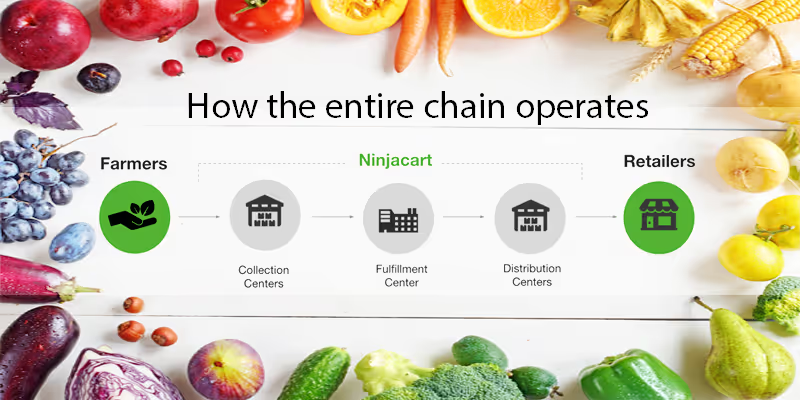

### **Objective:**
- The goal is to develop a multiclass image classification model that can:

  - Accurately identify onions, potatoes, tomatoes, and market scenes.
  - Support Ninjacart’s automation in sorting and supply chain efficiency.




##**Dataset Information:**
Dataset: [ninjacart_data](https://drive.google.com/file/d/1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT/view?usp=sharing)

### **Dataset Summary:**
The dataset is divided into two main folders: train and test.
Each contains four subfolders representing the classes:Indian market(noise),onion, potato and tomato.


**Data Collection:**

The images in this dataset were scraped from Google.


**Content**

- This dataset contains a folder train, which has a total of 3135 images, split into four folders as follows:

  - Tomato : 789
  
  - Potato : 898

  - Onion : 849

  - Indian market : 599


- This dataset contains another folder test which has a total of 351 images, split into four folders

  - Tomato : 106

  - potato : 83

  - onion : 81

  - Indian market : 81

# **Loading the "ninjacart_data" Dataset:**
Before loading the dataset we will import following libraries like TensorFlow, keras, matplotlib, opencv, seaborn etc.

In [69]:
import os
import glob
import random
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras import layers, models

from sklearn import metrics
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
import datetime

from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input

from tensorflow.keras.applications import ResNet101
# from tensorflow.keras.applications.resnet101 import preprocess_input

from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical

In [70]:
# pip install gdown

In [3]:
# Downloading our Dataset from Google drive using gdown command

!gdown https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT

Downloading...
From (original): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
From (redirected): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT&confirm=t&uuid=618f44d5-1fc7-424d-a849-d9ca3b9cb58d
To: /content/ninjacart_data.zip
100% 275M/275M [00:03<00:00, 73.1MB/s]


In [4]:
# Unzipping the ninjacart_data

!unzip -o ninjacart_data.zip

Archive:  ninjacart_data.zip
   creating: ninjacart_data/test/
   creating: ninjacart_data/test/indian market/
  inflating: ninjacart_data/test/indian market/bhl.jpeg  
  inflating: ninjacart_data/test/indian market/bhv.jpeg  
  inflating: ninjacart_data/test/indian market/bn.jpeg  
  inflating: ninjacart_data/test/indian market/hjx.jpeg  
  inflating: ninjacart_data/test/indian market/igis.jpeg  
  inflating: ninjacart_data/test/indian market/in.jpeg  
  inflating: ninjacart_data/test/indian market/india-4898453__340.jpg  
  inflating: ninjacart_data/test/indian market/indianmarket10.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket12.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket13.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket14.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket15.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket18.jpeg  
  inflating: ninjacart_data/test/indian market/indianmar

# **Basic Exploration of Data:**

In [5]:
train_dir = 'ninjacart_data/train'
test_dir = 'ninjacart_data/test'


<h3> Now let's plot some random images from our Dataset from each class !

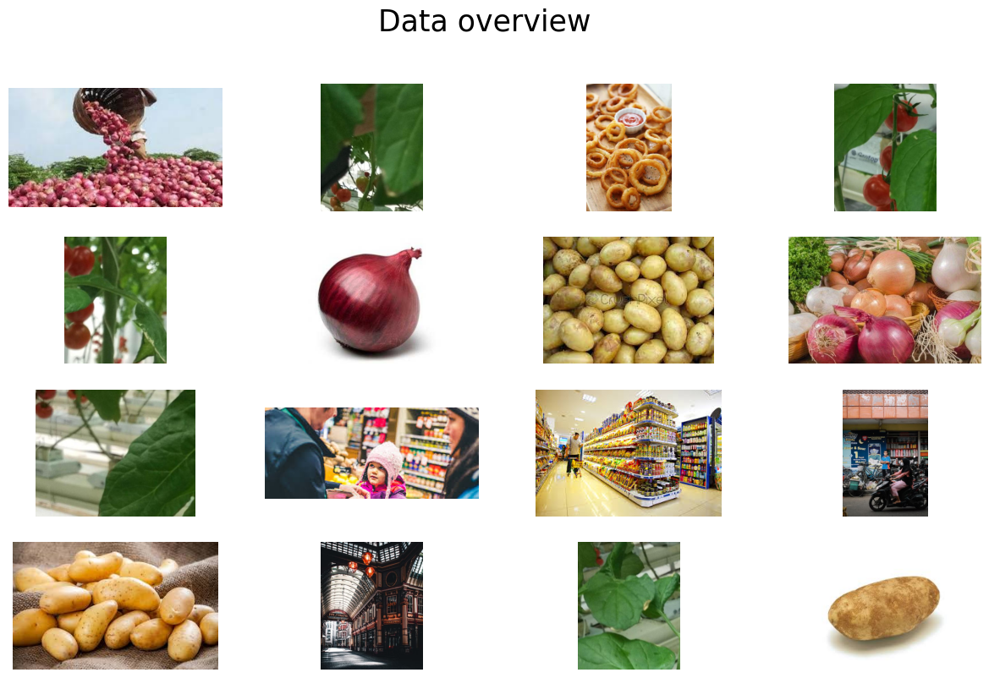

In [6]:
train_folder = 'ninjacart_data/train'

images = []
for folder in os.listdir(train_folder):
  for image in os.listdir(train_folder + '/' + folder):
    images.append(os.path.join(train_folder, folder, image))

fig = plt.figure(1, figsize=(15, 9))
fig.suptitle('Data overview', fontsize=25)
plt.axis('off')
n = 0
for i in range(16):
  n += 1
  random_img = random.choice(images)
  imgs = tf.keras.utils.load_img(random_img)
  plt.subplot(4, 4, n)
  plt.axis('off')
  plt.imshow(imgs)

plt.show()

In [7]:
class_dirs = os.listdir("/content/ninjacart_data/train") # list all directories inside "train" folder
image_dict = {} # dict to store image array(key) for every class(value)
count_dict = {} # dict to store count of files(key) for every class(value)
count_dict_test={}
print('Total Classes : ',class_dirs)
print()

# iterate over all class_dirs
for cls in class_dirs:
    # get list of all paths inside the subdirectory
    file_paths = glob.glob(f'/content/ninjacart_data/train/{cls}/*')
    #print(file_paths)
    count_dict[cls]=len(file_paths)
    image_path=random.choice(file_paths)
    image_dict[cls]=tf.keras.utils.load_img(image_path)

print('Training data - Total Images : \n',count_dict)
print()

for cls in class_dirs:
    # get list of all paths inside the subdirectory
    file_paths = glob.glob(f'/content/ninjacart_data/test/{cls}/*')
    count_dict_test[cls]=len(file_paths)

print('Test data - Total Images : \n',count_dict_test)
print()

Total Classes :  ['indian market', 'tomato', 'onion', 'potato']

Training data - Total Images : 
 {'indian market': 599, 'tomato': 789, 'onion': 849, 'potato': 898}

Test data - Total Images : 
 {'indian market': 81, 'tomato': 106, 'onion': 83, 'potato': 81}



### **Image Dimensions Analysis:**

<h4>Plot a Grid of training samples from each class to display their dimensions.

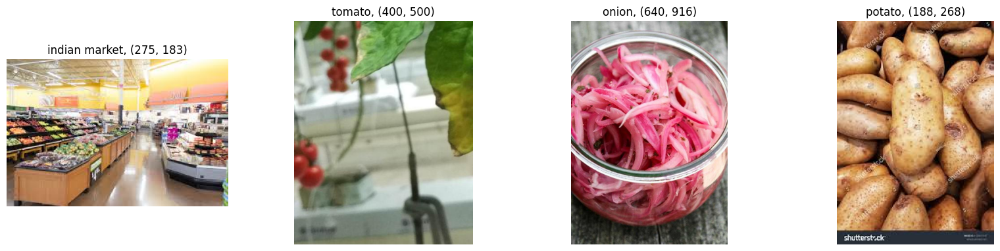

In [8]:
# Viz Random Sample Images from each class

plt.figure(figsize=(20, 15))
# iterate over dictionary items (class label, image array)
for i, (cls,img) in enumerate(image_dict.items()):
    # create a subplot axis
    ax = plt.subplot(3, 4, i + 1)
    # plot each image
    plt.imshow(img)
    # set "class name" along with "image size" as title
    plt.title(f'{cls}, {img.size}')
    plt.axis("off")

- We can see, our Dataset consists of uneven sized images !
- We have some images of the market, which we will label as class 'noise'.
- To feed this data into our models, we need to preprocess it

### **Class Distribution Analysis:**
- Let's visualize how many samples of each class we have and if there's any class imbalance or not.
- Plotting our Class distributions using our image_dict and count_dict which stores the images for each class along with its count.
- We also feed our count_dict to a Dataframe to print the count for each class in our training and test directories.

Count of training samples per class:
            class  count
0  indian market    599
1         tomato    789
2          onion    849
3         potato    898


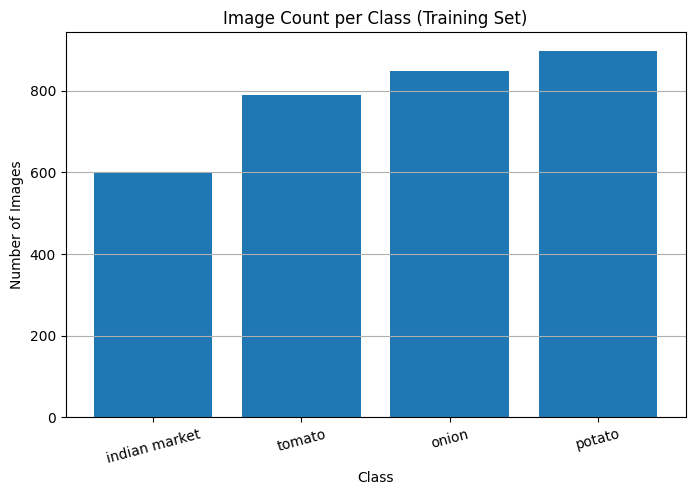

In [9]:
# Let's now Plot the Data Distribution of Training Data across Classes

df_count_train = pd.DataFrame({
    "class": count_dict.keys(),     # keys of count_dict are class labels
    "count": count_dict.values(),   # value of count_dict contain counts of each class
})
print("Count of training samples per class:\n", df_count_train)

# Plot using matplotlib
plt.figure(figsize=(8, 5))
plt.bar(df_count_train['class'], df_count_train['count'])
plt.title("Image Count per Class (Training Set)")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=15)
plt.grid(axis='y')
plt.show()

- From the above plot, we can see that our Data is not evenly distributed, but is also not imbalanced, so we are good to go !

- But what about the minority class (*indian market*) ?
    - We will use some {techniques} before feeding images to our network so that our model is generalized and is not biased for any class !

Count of training samples per class:
            class  count
0  indian market     81
1         tomato    106
2          onion     83
3         potato     81


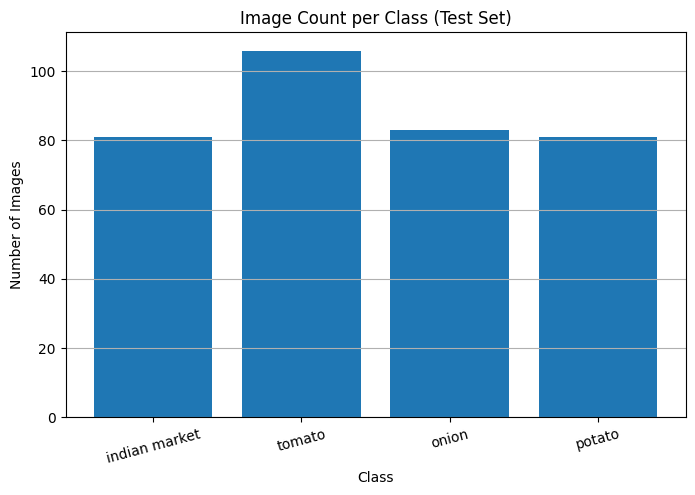

In [10]:
# Let's now Plot the Data Distribution of Test Data across Classes

df_count_test = pd.DataFrame({
    "class": count_dict.keys(),     # keys of count_dict are class labels
    "count": count_dict_test.values(),   # value of count_dict_test contain counts of each class in test data
})
print("Count of training samples per class:\n", df_count_test)

# Plot using matplotlib
plt.figure(figsize=(8, 5))
plt.bar(df_count_test['class'], df_count_test['count'])
plt.title("Image Count per Class (Test Set)")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=15)
plt.grid(axis='y')
plt.show()

# **Prepraring Data for Model Building:**

### Mounting the Dataset:
Now that we have analyzed and Explored our Raw Data, now to feed our Data into our model,
- Every image needs to be labelled according to its class and converted to a tensor.
- We will split our data into 3 sets : Train, Test and Validation.

For this task, we will use `tf.keras.utils.image_dataset_from_directory`, which will :

- Create an **(image, label)** pair for every image
- Automatically label the images using one-hot encoding
  - Eg : An image in the folder *indian market* will be labelled as **[1, 0, 0, 0]**
  - Since we have 4 classes, our classes will be one-hot encoded **alphabetically**,
  - meaning our first class is indian market, fourth will be tomato.

- Batching (Grouping) images together according to *batch_size*.
- Resize the Images to the shape ***(256, 256)***.
- Seed the shuffling of our images, so that it shuffles in a 'fixed' way

  - which will be used to create our validation data

- Splitting 20% of our training data for validation.
- Shuffling the data according to the `seed`.

In [11]:
# Loading and splitting the 'train' data into 80% training and 20% validation data
image_size = (256, 256)
batch_size = 64
train_ds, val_ds=tf.keras.utils.image_dataset_from_directory('/content/ninjacart_data/train',
                                                            label_mode = 'categorical',
                                                            image_size = image_size,
                                                            batch_size = batch_size,
                                                            validation_split=0.2,
                                                            subset='both',
                                                            shuffle=True,
                                                            seed=42)
# Loading test data
test_ds=tf.keras.utils.image_dataset_from_directory('/content/ninjacart_data/test',
                                                    label_mode = 'categorical',
                                                    image_size = image_size,
                                                    batch_size = batch_size,
                                                    shuffle=False)            # keep order for the confusion matrix later)

Found 3135 files belonging to 4 classes.
Using 2508 files for training.
Using 627 files for validation.
Found 351 files belonging to 4 classes.


- `label_mode = 'categorical'` one-hot encodes the classes **alphabetically,** So here **indian market** (which we consider noise) = class 1 and **tomato** = class 4

In [12]:
# Rescale and Prepare Data

# # Normalize pixel values between 0 and 1
# normalization_layer = tf.keras.layers.Rescaling(1./255)

# x_train = train_ds.map(lambda x, y: (normalization_layer(x), y))
# x_val = val_ds.map(lambda x, y: (normalization_layer(x), y))

# **Defining Some functions for repeatative Use:**

In [13]:
def plot_acc_loss(model_history):

  fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15,5))
  ax = axes.ravel()

  n_epochs = len(model_history.history['loss'])

  #accuracy graph
  ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['acc']], label='Train', color='b')
  ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['val_acc']], label='Val', color='r')
  ax[0].set_title('Accuracy vs. epoch', fontsize=15)
  ax[0].set_ylabel('Accuracy', fontsize=15)
  ax[0].set_xlabel('epoch', fontsize=15)
  ax[0].legend()

  #loss graph
  ax[1].plot(range(0, n_epochs), model_history.history['loss'], label='Train', color='b')
  ax[1].plot(range(0, n_epochs), model_history.history['val_loss'], label='Val', color='r')
  ax[1].set_title('Loss vs. epoch', fontsize=15)
  ax[1].set_ylabel('Loss', fontsize=15)
  ax[1].set_xlabel('epoch', fontsize=15)
  ax[1].legend()

  #display the graph
  plt.show()

In [14]:
noise_path = 'ninjacart_data/test/indian market'
onion_path = 'ninjacart_data/test/onion'
potato_path = 'ninjacart_data/test/potato'
tomato_path = 'ninjacart_data/test/tomato'


def classwise_accuracy(class_path, class_name, model_name) :
    paths = []
    for i in os.listdir(class_path):
        paths.append(class_path + "/" + str(i))

    correct = 0
    total = 0

    for i in range(len(paths)):
        total+= 1

        img = tf.keras.utils.load_img(paths[i])
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img, verbose=0)
        if tf.argmax(pred[0]) == class_names.index(f"{class_name}"):
            correct+= 1

    print(f"Accuracy for class {class_name} is {round((correct/total)*100, 2)}% consisting of {len(paths)} images")

In [15]:
def ConfusionMatrix(class_path, pred_list, model_name) :
    noise, tomato, potato, onion = 0, 0, 0, 0
    for i in os.listdir(class_path):

        img = tf.keras.utils.load_img(class_path + "/" + str(i))
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img, verbose=0)
        predicted = tf.argmax(pred, 1).numpy().item()

        if predicted == 0:
            noise+= 1
        elif predicted == 1:
            onion+= 1
        elif predicted == 2:
            potato+= 1
        else:
            tomato+= 1


    for item in noise, onion, potato, tomato :
        pred_list.append(item)

# **1. CNN Classifier Model:**
Let's build a baseline CNN Architecture with some Convolutional blocks which MaxPooling.

In [16]:
# Build model
cnn_model = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255, input_shape = (*image_size, 3)),

    tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.MaxPool2D(pool_size = (2,2)),

    tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    tf.keras.layers.MaxPool2D(pool_size = (2,2)),

    tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),

    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(4, activation = 'softmax')
    ])

# Compile
cnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)


cnn_model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 139,940 (546.64 KB)

 Trainable params: 139,940 (546.64 KB)

 Non-trainable params: 0 (0.00 B)

### **Training the cnn_model:**

In [17]:
history = cnn_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=20
)

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 68s 942ms/step - acc: 0.2939 - loss: 1.3751 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_acc: 0.2855 - val_loss: 1.3093 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 13s 312ms/step - acc: 0.4132 - loss: 1.2871 - precision: 0.2902 - recall: 7.8533e-04 - val_acc: 0.5917 - val_loss: 1.1013 - val_precision: 0.8182 - val_recall: 0.0287
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 20s 305ms/step - acc: 0.5955 - loss: 1.0453 - precision: 0.8573 - recall: 0.1544 - val_acc: 0.6380 - val_loss: 0.8692 - val_precision: 0.8085 - val_recall: 0.4577
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 20s 283ms/step - acc: 0.6735 - loss: 0.8591 - precision: 0.8548 - recall: 0.4333 - val_acc: 0.6778 - val_loss: 0.7942 - val_precision: 0.8010 - val_recall: 0.4944
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 287ms/step - acc: 0.7374 - loss: 0.7560 - precision: 0.8435 - recall: 0.5404 - val_acc: 0.6954 - val_loss: 0.7590 - val_precision: 0.7

### **Plotting our Model's performance:**

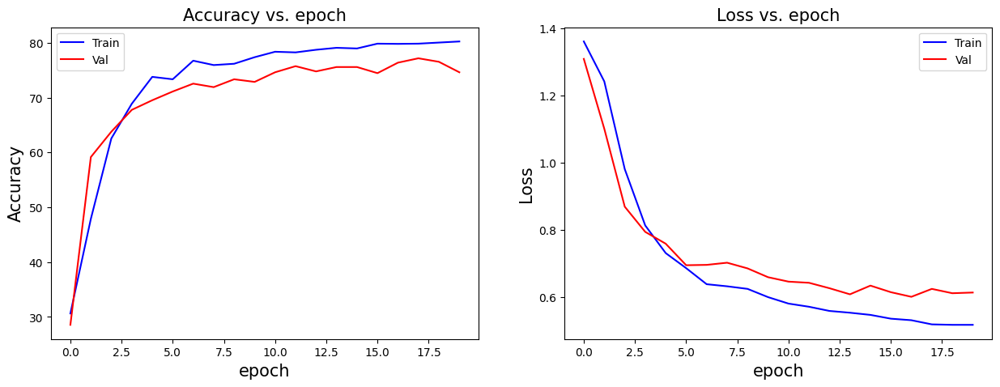

In [18]:
# Plot for Training vs Validation Accuracy and loss
plot_acc_loss(history)

### **Testing the model:**

We list all the files in our test directory and append their complete paths to a list *test_images* which we will use to test our model by predicting on on random unseen data.

In [19]:
test_images = []

for folder in os.listdir(test_dir):
  for image in os.listdir(test_dir + '/' + folder):
    test_images.append(os.path.join(test_dir, folder, image))

### Random Sample Testing:
To test our model on a random sample :

  - Read a random image from test_images list containing paths of all test images.
  - Resize an image to (256, 256).
  - Add an extra dimension to our image's first dimension index.
  - Predict on the image using model.predict().

In [20]:
class_names = ['indian market', 'tomato', 'potato', 'onion']
def grid_test_model(model_name):

  fig = plt.figure(1, figsize=(17, 11))
  plt.axis('off')
  n = 0
  for i in range(8):
    n += 1

    img_0 = tf.keras.utils.load_img(random.choice(test_images))
    img_0 = tf.keras.utils.img_to_array(img_0)
    img_0 = tf.image.resize(img_0, (256, 256))
    img_1 = tf.expand_dims(img_0, axis = 0)

    pred = model_name.predict(img_1)
    predicted_label = tf.argmax(pred, 1).numpy().item()

    for item in pred :
      item = tf.round((item*100))

    plt.subplot(2, 4, n)
    plt.axis('off')
    plt.title(f'prediction : {class_names[predicted_label]}\n\n'
              f'{item[0]} % {class_names[0]}\n'
              f'{item[1]} % {class_names[1]}\n'
              f'{item[2]} % {class_names[2]}\n'
              f'{item[3]} % {class_names[3]}\n')
    plt.imshow(img_0/255)
  plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


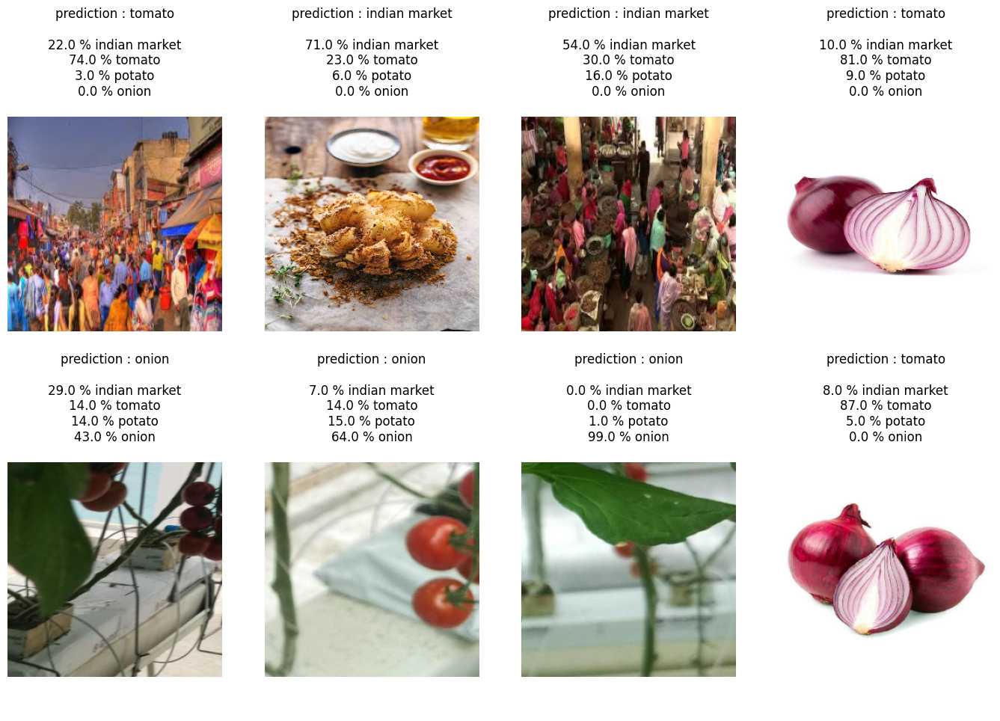

In [21]:
grid_test_model(cnn_model)

- By observing the above plot, we can analyze that our Model is **not too sure** of the correct class....
  - We have to revamp our model to increase its confidence.

- Also, notice how our images are evenly sized (128x128) now !

### **Evaluating accuracy on each class:**
First we specify paths of each of our test classes

  - We define a function classwise_accuracy which calculates accuracy for each class by taking in class path and model.
  - We append all the file paths for the input class in a list
  from which we predict on all images and check if the label and predicted label are equal,
  according to which we calculate the accuracy of our model on the input class.

In [22]:
classwise_accuracy(noise_path, 'indian market', cnn_model)
classwise_accuracy(onion_path, 'onion', cnn_model)
classwise_accuracy(potato_path, 'potato', cnn_model)
classwise_accuracy(tomato_path, 'tomato', cnn_model)

Accuracy for class indian market is 77.78% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 67.9% consisting of 81 images
Accuracy for class tomato is 2.83% consisting of 106 images


### **Plotting the Confusion Matrix:**

- We define four empty lists, in which we will store predicted classes by our model for a particular class images.
- We defined a function `confusion_matrix` which takes in the path of the class, empty list and the model.
- The function reads an image from the given path, resizes it and converts to RGB.
- Add an extra dimension at first index of the image and predict on the image with the input model.
- Check which class the model has predicted the image belongs to and append +1 to the index of the class.
  - Eg : If the model predicts that the image belongs to class tomato
  - we will append +1 at the fourth index(3) of our list like [0, 0, 0, 1]
- After calculating the value in our 4 lists for each class,
<br>we combine them, which gives us the confusion matrix of our model and plot them with seaborn.

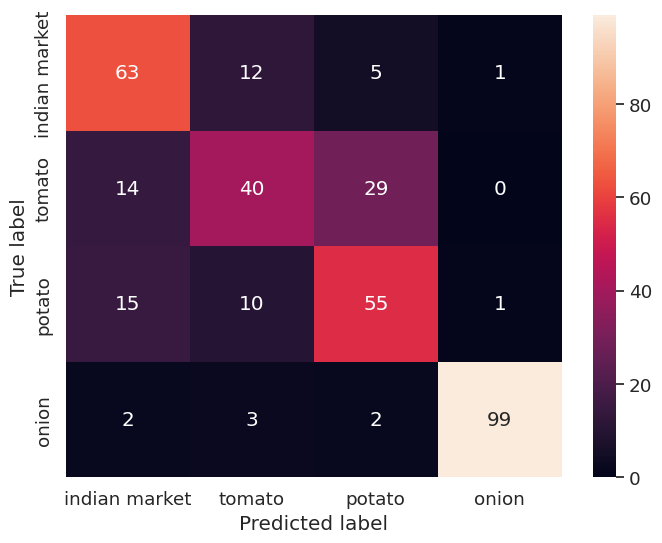

In [23]:
sns.set(rc={'figure.figsize':(8, 6)})
sns.set(font_scale=1.2)


noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []

ConfusionMatrix(noise_path, l1, cnn_model)
ConfusionMatrix(onion_path, l2, cnn_model)
ConfusionMatrix(potato_path, l3, cnn_model)
ConfusionMatrix(tomato_path, l4, cnn_model)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [24]:
result = cnn_model.evaluate(test_ds)
dict(zip(cnn_model.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 898ms/step - acc: 0.7214 - loss: 0.6125 - precision: 0.7723 - recall: 0.6828


{'loss': 0.5864806771278381, 'compile_metrics': 0.7435897588729858}

- The **train accuracy is 80% and test accuracy is 72%**.
- We can observe that our basline CNN model has a categorical cross entropy loss of ~ 0.5, which indicates **overfitting**, now let's work on how we can improve our model's performance by using some certain techniques !

## **Model Tuning - Solving Overfitting:**

### **Augmenting our Data:**
- Data Augmentation introduces our model to different aspects and visualizaitons of class images, therefore increasing model generalization.
- We apply 3 types of augmentation on our training dataset.
  - `RandomFlip` : randomly flips images horizontally and vertically during training.

  - `RandomRotation` : randomly rotates images during training by a factor.
  
  - `RandomTranslation` : randomly translates images during training by a shift factor.

In [25]:
# Data Augmentation

from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomTranslation

augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

### **Adding BatchNormalization and Dropout:**
We add `Dropout()` and `BatchNormalization()` to our model architecture, which will help in improving its generalization.
<br><br>
How do they help ?
- `Dropout()` : Drops out random neurons while training which forces the model to focus on every feature for prediction.

- `BatchNormalization()` : Normalizes the inputs from previous layer for every mini-batch before sending it to the next layer.
<br>Help in mantaining the distribution of our data by making it a normal distribution (mean = 0, std. = 1).

In [26]:
imaze_size = (256, 256)

In [27]:
# Model with BatchNormalization + Dropout

cnn_model_revamp = tf.keras.Sequential([

tf.keras.layers.Rescaling(1./255,  input_shape=(*imaze_size, 3)),

tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),

tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),

tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.GlobalAveragePooling2D(),
tf.keras.layers.Dropout(rate = 0.2),

tf.keras.layers.Dense(4, activation = 'softmax')
])

cnn_model_revamp.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)


cnn_model_revamp.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 256, 256, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 140,836 (550.14 KB)

 Trainable params: 140,388 (548.39 KB)

 Non-trainable params: 448 (1.75 KB)

### **Implementing Callbacks:**

We specify some callbacks to improve our model training process :
- `TensorBoard` : Enable visualizations for TensorBoard for our model's metrics, which we will plot later.

- `ModelCheckpoint` : Callback to save the model weights at a given frequency,
<br> saves the best model having the lowest 'val_loss' by default.

- `EarlyStopping` : Stop training when a monitored metric (val_loss) has stopped improving,
<br>after waiting for 5 epochs, specified by `patience=5`.

In [28]:
log_dir_cnn_model_tuned = "logs/Custom_CNN_revamp"

callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint("best_augmented_cnn_model.h5", save_best_only=True, monitor='val_loss'),
    TensorBoard(log_dir=log_dir_cnn_model_tuned, histogram_freq=1)
]

In [29]:
history_1 = cnn_model_revamp.fit(
    train_ds,
    epochs=20,
    validation_data=val_ds,
    callbacks=callbacks
)

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 958ms/step - acc: 0.6145 - loss: 0.9683 - precision: 0.7597 - recall: 0.3638

40/40 ━━━━━━━━━━━━━━━━━━━━ 54s 1s/step - acc: 0.6164 - loss: 0.9645 - precision: 0.7610 - recall: 0.3678 - val_acc: 0.2648 - val_loss: 1.3801 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - acc: 0.7709 - loss: 0.6086 - precision: 0.8413 - recall: 0.7004 - val_acc: 0.2648 - val_loss: 1.4191 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step - acc: 0.8190 - loss: 0.5237 - precision: 0.8622 - recall: 0.7472 - val_acc: 0.2648 - val_loss: 1.4354 - val_precision: 0.8940 - val_recall: 0.2153
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - acc: 0.8081 - loss: 0.5195 - precision: 0.8541 - recall: 0.7552 - val_acc: 0.2648 - val_loss: 1.4045 - val_precision: 0.6778 - val_recall: 0.2584
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - acc: 0.8162 - loss: 0.4925 - precision: 0.8616 - recall: 0.7695

40/40 ━━━━━━━━━━━━━━━━━━━━ 89s 1s/step - acc: 0.8163 - loss: 0.4925 - precision: 0.8616 - recall: 0.7696 - val_acc: 0.2648 - val_loss: 1.3612 - val_precision: 0.5971 - val_recall: 0.2648
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 995ms/step - acc: 0.8232 - loss: 0.4534 - precision: 0.8721 - recall: 0.7736

40/40 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - acc: 0.8233 - loss: 0.4536 - precision: 0.8722 - recall: 0.7737 - val_acc: 0.2935 - val_loss: 1.2849 - val_precision: 0.5907 - val_recall: 0.2648
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 982ms/step - acc: 0.8330 - loss: 0.4567 - precision: 0.8733 - recall: 0.7873

40/40 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - acc: 0.8329 - loss: 0.4567 - precision: 0.8732 - recall: 0.7872 - val_acc: 0.3493 - val_loss: 1.2002 - val_precision: 0.6336 - val_recall: 0.2648
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 961ms/step - acc: 0.8178 - loss: 0.4533 - precision: 0.8674 - recall: 0.7860

40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - acc: 0.8182 - loss: 0.4530 - precision: 0.8675 - recall: 0.7862 - val_acc: 0.3892 - val_loss: 1.1702 - val_precision: 0.5516 - val_recall: 0.2727
Epoch 9/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 955ms/step - acc: 0.8493 - loss: 0.4161 - precision: 0.8755 - recall: 0.8057

40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - acc: 0.8493 - loss: 0.4160 - precision: 0.8756 - recall: 0.8057 - val_acc: 0.4673 - val_loss: 1.0608 - val_precision: 0.6073 - val_recall: 0.2935
Epoch 10/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 955ms/step - acc: 0.8530 - loss: 0.4156 - precision: 0.8846 - recall: 0.8188

40/40 ━━━━━━━━━━━━━━━━━━━━ 83s 999ms/step - acc: 0.8529 - loss: 0.4155 - precision: 0.8845 - recall: 0.8186 - val_acc: 0.6013 - val_loss: 0.9457 - val_precision: 0.7244 - val_recall: 0.3604
Epoch 11/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 964ms/step - acc: 0.8552 - loss: 0.3706 - precision: 0.8910 - recall: 0.8238

40/40 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - acc: 0.8548 - loss: 0.3715 - precision: 0.8906 - recall: 0.8234 - val_acc: 0.6555 - val_loss: 0.8161 - val_precision: 0.8729 - val_recall: 0.4928
Epoch 12/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 966ms/step - acc: 0.8597 - loss: 0.3862 - precision: 0.8868 - recall: 0.8254

40/40 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - acc: 0.8596 - loss: 0.3864 - precision: 0.8867 - recall: 0.8253 - val_acc: 0.6794 - val_loss: 0.7362 - val_precision: 0.8217 - val_recall: 0.5439
Epoch 13/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 959ms/step - acc: 0.8612 - loss: 0.3701 - precision: 0.8868 - recall: 0.8280

40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - acc: 0.8613 - loss: 0.3703 - precision: 0.8868 - recall: 0.8280 - val_acc: 0.7783 - val_loss: 0.5829 - val_precision: 0.8815 - val_recall: 0.6762
Epoch 14/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 957ms/step - acc: 0.8642 - loss: 0.3547 - precision: 0.8921 - recall: 0.8307

40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - acc: 0.8641 - loss: 0.3551 - precision: 0.8920 - recall: 0.8306 - val_acc: 0.8118 - val_loss: 0.5343 - val_precision: 0.8833 - val_recall: 0.7241
Epoch 15/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 974ms/step - acc: 0.8586 - loss: 0.3655 - precision: 0.8882 - recall: 0.8318

40/40 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - acc: 0.8586 - loss: 0.3658 - precision: 0.8882 - recall: 0.8317 - val_acc: 0.8006 - val_loss: 0.5181 - val_precision: 0.8678 - val_recall: 0.7225
Epoch 16/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 972ms/step - acc: 0.8744 - loss: 0.3579 - precision: 0.9005 - recall: 0.8454

40/40 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - acc: 0.8741 - loss: 0.3581 - precision: 0.9003 - recall: 0.8452 - val_acc: 0.8453 - val_loss: 0.4147 - val_precision: 0.8907 - val_recall: 0.7799
Epoch 17/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 964ms/step - acc: 0.8785 - loss: 0.3393 - precision: 0.9025 - recall: 0.8555

40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - acc: 0.8783 - loss: 0.3395 - precision: 0.9024 - recall: 0.8552 - val_acc: 0.8469 - val_loss: 0.3990 - val_precision: 0.8825 - val_recall: 0.8022
Epoch 18/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - acc: 0.8614 - loss: 0.3633 - precision: 0.8845 - recall: 0.8362 - val_acc: 0.8421 - val_loss: 0.4150 - val_precision: 0.8664 - val_recall: 0.7863
Epoch 19/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - acc: 0.8796 - loss: 0.3303 - precision: 0.9027 - recall: 0.8529 - val_acc: 0.8214 - val_loss: 0.4416 - val_precision: 0.8581 - val_recall: 0.7911
Epoch 20/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - acc: 0.8872 - loss: 0.3229 - precision: 0.9068 - recall: 0.8609 - val_acc: 0.8405 - val_loss: 0.4110 - val_precision: 0.8517 - val_recall: 0.8150


In [30]:
result = cnn_model_revamp.evaluate(test_ds)
dict(zip(cnn_model_revamp.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 293ms/step - acc: 0.6856 - loss: 0.6858 - precision: 0.7167 - recall: 0.6553


{'loss': 0.5016309022903442, 'compile_metrics': 0.7720797657966614}

In [31]:
classwise_accuracy(noise_path, 'indian market', cnn_model_revamp)
classwise_accuracy(onion_path, 'onion', cnn_model_revamp)
classwise_accuracy(potato_path, 'potato', cnn_model_revamp)
classwise_accuracy(tomato_path, 'tomato', cnn_model_revamp)

Accuracy for class indian market is 50.62% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 76.54% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


- The **train accuracy is 87% and test accuracy is 83%**.

<h3> We observe an <b>accuracy jump of ~10 %</b> by just :

- Applying augmentation to our data.
- Adding Dropout and BatchNormalization.
- Implementing callbacks during training.

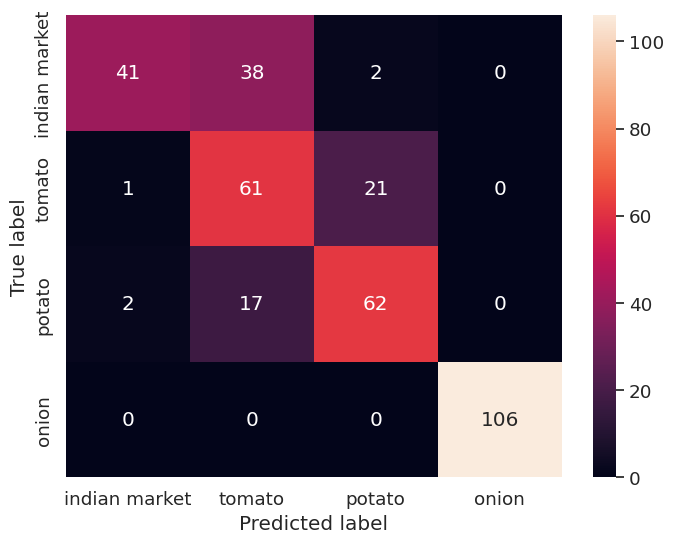

In [32]:
sns.set(rc={'figure.figsize':(8, 6)})
sns.set(font_scale=1.2)


noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []


ConfusionMatrix(noise_path, l1, cnn_model_revamp)
ConfusionMatrix(onion_path, l2, cnn_model_revamp)
ConfusionMatrix(potato_path, l3, cnn_model_revamp)
ConfusionMatrix(tomato_path, l4, cnn_model_revamp)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

<h4>In the Confusion matrix plotted above, we can observe that :

- Our model can easily differentiate between all classes with minimal error.
- Potato and onion are the most confusing classes for our model.
- Tomato can be easily differentiated with the smallest error.

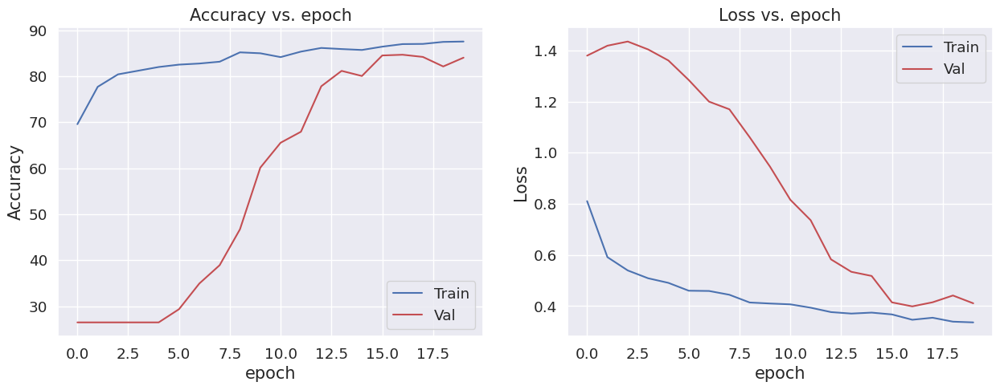

In [33]:
plot_acc_loss(history_1)

### Applying Transfer Learning:

- Now that we solved overfitting problem of our Baseline model.
- Let's also explore and implement some state-of-the-art model architectures which can give us even higher precision and accuracy.

- We explored some of the available pretrained model which we can finetune to our data,
<br> We will train 3 of the most efficient and accurate pretrained models on the ImageNet dataset.

The Models we will use :
- VGG-19
- ResNet
- MobileNet

# **2. VGG19_Model:**

In [34]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

In [35]:
# load base model
pretrained_model_1 = tf.keras.applications.vgg19.VGG19(input_shape=(256, 256, 3), include_top = False)

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [36]:
# append classification layer
VGG19_model = pretrained_model_1.output

VGG19_model=tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255, input_shape = (*image_size, 3)),
    pretrained_model_1,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate = 0.1),
    tf.keras.layers.Dense(4, activation = 'softmax')
    ])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [37]:
VGG19_model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)


VGG19_model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg19 (Functional)              │ (None, 8, 8, 512)      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,026,436 (76.39 MB)

 Trainable params: 20,026,436 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

In [38]:
# callbacks for VGG19
log_dir_VGG19_model = "logs/VGG19"

callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint("VGG19_model.h5", save_best_only=True, monitor='val_loss'),
    TensorBoard(log_dir=log_dir_VGG19_model, histogram_freq=1)
]

In [39]:
history_2 = VGG19_model.fit(train_ds, validation_data = val_ds, epochs = 20, callbacks=callbacks)

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.4137 - loss: 1.2859 - precision: 0.4805 - recall: 0.1849

40/40 ━━━━━━━━━━━━━━━━━━━━ 291s 5s/step - acc: 0.4163 - loss: 1.2802 - precision: 0.4848 - recall: 0.1886 - val_acc: 0.7640 - val_loss: 0.5656 - val_precision: 0.7993 - val_recall: 0.6858
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 136s 2s/step - acc: 0.7760 - loss: 0.5432 - precision: 0.8283 - recall: 0.7406 - val_acc: 0.7767 - val_loss: 0.5923 - val_precision: 0.7986 - val_recall: 0.7464
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 145s 2s/step - acc: 0.8374 - loss: 0.4294 - precision: 0.8666 - recall: 0.8000 - val_acc: 0.7815 - val_loss: 0.6156 - val_precision: 0.8007 - val_recall: 0.7624
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - acc: 0.8841 - loss: 0.3314 - precision: 0.8978 - recall: 0.8628

40/40 ━━━━━━━━━━━━━━━━━━━━ 146s 3s/step - acc: 0.8841 - loss: 0.3307 - precision: 0.8979 - recall: 0.8630 - val_acc: 0.8804 - val_loss: 0.3762 - val_precision: 0.8880 - val_recall: 0.8724
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - acc: 0.8965 - loss: 0.2715 - precision: 0.9124 - recall: 0.8825

40/40 ━━━━━━━━━━━━━━━━━━━━ 105s 3s/step - acc: 0.8966 - loss: 0.2712 - precision: 0.9124 - recall: 0.8826 - val_acc: 0.9043 - val_loss: 0.3083 - val_precision: 0.9209 - val_recall: 0.8915
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - acc: 0.9129 - loss: 0.2375 - precision: 0.9268 - recall: 0.9005

40/40 ━━━━━━━━━━━━━━━━━━━━ 101s 2s/step - acc: 0.9129 - loss: 0.2377 - precision: 0.9267 - recall: 0.9005 - val_acc: 0.9250 - val_loss: 0.2504 - val_precision: 0.9291 - val_recall: 0.9203
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 106s 3s/step - acc: 0.9265 - loss: 0.2119 - precision: 0.9397 - recall: 0.9192 - val_acc: 0.9027 - val_loss: 0.3108 - val_precision: 0.9137 - val_recall: 0.8947
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 105s 3s/step - acc: 0.9137 - loss: 0.2404 - precision: 0.9287 - recall: 0.9006 - val_acc: 0.9155 - val_loss: 0.2689 - val_precision: 0.9211 - val_recall: 0.9123
Epoch 9/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - acc: 0.9219 - loss: 0.2091 - precision: 0.9312 - recall: 0.9110

40/40 ━━━━━━━━━━━━━━━━━━━━ 136s 2s/step - acc: 0.9218 - loss: 0.2095 - precision: 0.9311 - recall: 0.9108 - val_acc: 0.9442 - val_loss: 0.2430 - val_precision: 0.9501 - val_recall: 0.9410
Epoch 10/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - acc: 0.9137 - loss: 0.2531 - precision: 0.9241 - recall: 0.9031

40/40 ━━━━━━━━━━━━━━━━━━━━ 105s 3s/step - acc: 0.9139 - loss: 0.2524 - precision: 0.9242 - recall: 0.9032 - val_acc: 0.9187 - val_loss: 0.2405 - val_precision: 0.9272 - val_recall: 0.9139
Epoch 11/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 103s 3s/step - acc: 0.9220 - loss: 0.2181 - precision: 0.9322 - recall: 0.9112 - val_acc: 0.9075 - val_loss: 0.2657 - val_precision: 0.9172 - val_recall: 0.9011
Epoch 12/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - acc: 0.9343 - loss: 0.1633 - precision: 0.9464 - recall: 0.9274

40/40 ━━━━━━━━━━━━━━━━━━━━ 105s 3s/step - acc: 0.9343 - loss: 0.1636 - precision: 0.9463 - recall: 0.9274 - val_acc: 0.9298 - val_loss: 0.2138 - val_precision: 0.9339 - val_recall: 0.9234
Epoch 13/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 103s 3s/step - acc: 0.9485 - loss: 0.1417 - precision: 0.9546 - recall: 0.9441 - val_acc: 0.9059 - val_loss: 0.3469 - val_precision: 0.9072 - val_recall: 0.9043
Epoch 14/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 105s 3s/step - acc: 0.9413 - loss: 0.1824 - precision: 0.9480 - recall: 0.9335 - val_acc: 0.8884 - val_loss: 0.3563 - val_precision: 0.8977 - val_recall: 0.8820
Epoch 15/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - acc: 0.9336 - loss: 0.1886 - precision: 0.9452 - recall: 0.9252

40/40 ━━━━━━━━━━━━━━━━━━━━ 145s 3s/step - acc: 0.9336 - loss: 0.1884 - precision: 0.9451 - recall: 0.9252 - val_acc: 0.9346 - val_loss: 0.1932 - val_precision: 0.9420 - val_recall: 0.9330
Epoch 16/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - acc: 0.9510 - loss: 0.1248 - precision: 0.9559 - recall: 0.9473

40/40 ━━━━━━━━━━━━━━━━━━━━ 145s 3s/step - acc: 0.9510 - loss: 0.1249 - precision: 0.9560 - recall: 0.9473 - val_acc: 0.9522 - val_loss: 0.1450 - val_precision: 0.9552 - val_recall: 0.9522
Epoch 17/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 105s 3s/step - acc: 0.9528 - loss: 0.1324 - precision: 0.9607 - recall: 0.9504 - val_acc: 0.9426 - val_loss: 0.2044 - val_precision: 0.9454 - val_recall: 0.9394
Epoch 18/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 136s 2s/step - acc: 0.9525 - loss: 0.1163 - precision: 0.9558 - recall: 0.9514 - val_acc: 0.9426 - val_loss: 0.1966 - val_precision: 0.9440 - val_recall: 0.9410
Epoch 19/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 105s 3s/step - acc: 0.9457 - loss: 0.1621 - precision: 0.9493 - recall: 0.9389 - val_acc: 0.9442 - val_loss: 0.2113 - val_precision: 0.9530 - val_recall: 0.9378
Epoch 20/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 135s 2s/step - acc: 0.9575 - loss: 0.1401 - precision: 0.9625 - recall: 0.9495 - val_acc: 0.8357 - val_loss: 0.4773 - val_precision: 0.8365 - val_recall: 0.8325


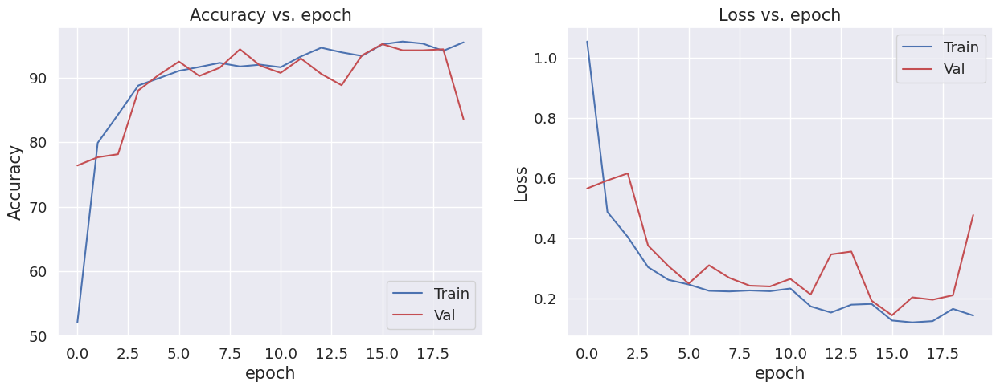

In [40]:
# Evaluating VGG19_model
plot_acc_loss(history_2)

In [41]:
classwise_accuracy(noise_path, 'indian market', VGG19_model)
classwise_accuracy(onion_path, 'onion', VGG19_model)
classwise_accuracy(potato_path, 'potato', VGG19_model)
classwise_accuracy(tomato_path, 'tomato', VGG19_model)

Accuracy for class indian market is 83.95% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 81.48% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


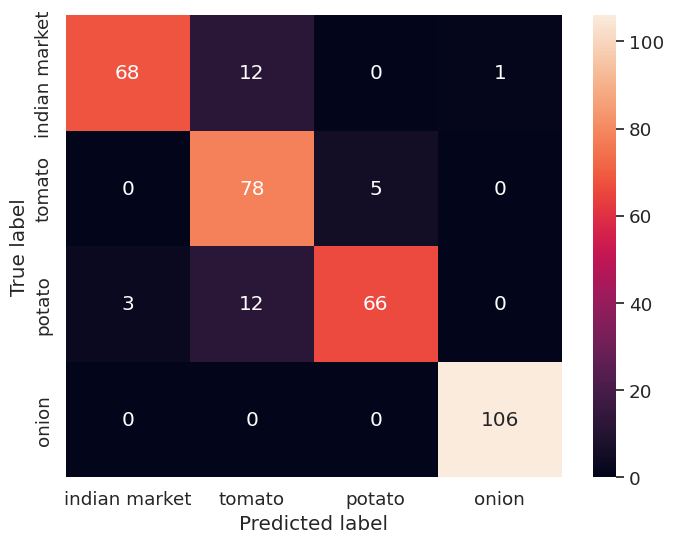

In [42]:
# ConfusionMatrix
l1 = []
l2 = []
l3 = []
l4 = []

ConfusionMatrix(noise_path, l1, VGG19_model)
ConfusionMatrix(onion_path, l2, VGG19_model)
ConfusionMatrix(potato_path, l3, VGG19_model)
ConfusionMatrix(tomato_path, l4, VGG19_model)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [43]:
result = VGG19_model.evaluate(test_ds)
dict(zip(VGG19_model.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 20s 4s/step - acc: 0.8845 - loss: 0.4651 - precision: 0.8914 - recall: 0.8760


{'loss': 0.318578839302063, 'compile_metrics': 0.9088318943977356}

We achieved **train accuracy as 94% and  test accuracy of 90%** on our finetuned VGG19 Model.

# **3. ResNet101_Model:**

In [44]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

In [45]:
# load base model
pretrained_model_2=tf.keras.applications.ResNet101(weights='imagenet',include_top=False,input_shape=(256,256,3))

171446536/171446536 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [46]:
ResNet101_model=tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255, input_shape=(256,256,3)),
    pretrained_model_2,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate = 0.1),
    tf.keras.layers.Dense(4, activation = 'softmax')
    ])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [47]:
ResNet101_model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)
ResNet101_model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_3 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet101 (Functional)          │ (None, 8, 8, 2048)     │    42,658,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │         8,196 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 42,666,372 (162.76 MB)

 Trainable params: 42,561,028 (162.36 MB)

 Non-trainable params: 105,344 (411.50 KB)

In [48]:
# Callbacks for ResNet
log_dir_ResNet101_model = "logs/ResNet101"

callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint("ResNet101_model.h5", save_best_only=True, monitor='val_loss'),
    TensorBoard(log_dir=log_dir_ResNet101_model, histogram_freq=1)
]

In [49]:
history_3 = ResNet101_model.fit(train_ds, validation_data = val_ds, epochs = 20, callbacks=callbacks)

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.7773 - loss: 0.5792 - precision: 0.8254 - recall: 0.7048

40/40 ━━━━━━━━━━━━━━━━━━━━ 319s 5s/step - acc: 0.7799 - loss: 0.5727 - precision: 0.8276 - recall: 0.7085 - val_acc: 0.1627 - val_loss: 3.5736 - val_precision: 0.1627 - val_recall: 0.1627
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.9617 - loss: 0.1150 - precision: 0.9643 - recall: 0.9566

40/40 ━━━━━━━━━━━━━━━━━━━━ 149s 4s/step - acc: 0.9618 - loss: 0.1148 - precision: 0.9644 - recall: 0.9567 - val_acc: 0.3301 - val_loss: 1.6484 - val_precision: 0.1000 - val_recall: 0.0016
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.9711 - loss: 0.0840 - precision: 0.9736 - recall: 0.9689

40/40 ━━━━━━━━━━━━━━━━━━━━ 207s 4s/step - acc: 0.9711 - loss: 0.0838 - precision: 0.9736 - recall: 0.9689 - val_acc: 0.2982 - val_loss: 1.4564 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 183s 3s/step - acc: 0.9764 - loss: 0.0639 - precision: 0.9781 - recall: 0.9753 - val_acc: 0.1435 - val_loss: 2.1973 - val_precision: 0.1139 - val_recall: 0.1005
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 129s 3s/step - acc: 0.9807 - loss: 0.0678 - precision: 0.9810 - recall: 0.9802 - val_acc: 0.1627 - val_loss: 5.3459 - val_precision: 0.1627 - val_recall: 0.1627
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 141s 3s/step - acc: 0.9778 - loss: 0.0675 - precision: 0.9786 - recall: 0.9743 - val_acc: 0.1627 - val_loss: 4.1220 - val_precision: 0.1627 - val_recall: 0.1627
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 131s 3s/step - acc: 0.9862 - loss: 0.0406 - precision: 0.9862 - recall: 0.9847 - val_acc: 0.1643 - val_loss: 4.1298 - val_precision: 0.1632 - val_recall: 0.1627
Epoch 8/

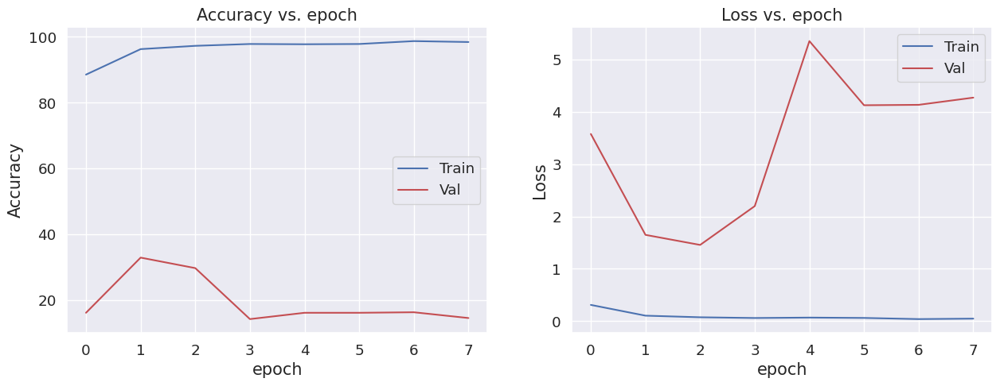

In [50]:
# Evaluating ResNet101_model
plot_acc_loss(history_3)

In [51]:
classwise_accuracy(noise_path, 'indian market', ResNet101_model)
classwise_accuracy(onion_path, 'onion', ResNet101_model)
classwise_accuracy(potato_path, 'potato', ResNet101_model)
classwise_accuracy(tomato_path, 'tomato', ResNet101_model)

Accuracy for class indian market is 0.0% consisting of 81 images
Accuracy for class onion is 98.8% consisting of 83 images
Accuracy for class potato is 0.0% consisting of 81 images
Accuracy for class tomato is 1.89% consisting of 106 images


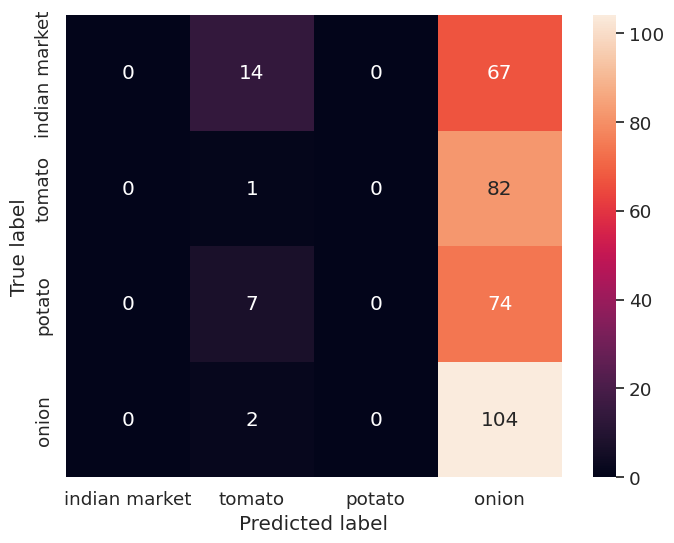

In [52]:
# ConfusionMatrix
l1 = []
l2 = []
l3 = []
l4 = []

ConfusionMatrix(noise_path, l1, ResNet101_model)
ConfusionMatrix(onion_path, l2, ResNet101_model)
ConfusionMatrix(potato_path, l3, ResNet101_model)
ConfusionMatrix(tomato_path, l4, ResNet101_model)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [53]:
result = ResNet101_model.evaluate(test_ds)
dict(zip(ResNet101_model.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - acc: 0.1264 - loss: 1.8890 - precision: 0.0000e+00 - recall: 0.0000e+00


{'loss': 1.563836693763733, 'compile_metrics': 0.29914531111717224}

- We achieved **a train accuracy as 98% and test accuracy of 29% on our finetuned ResNet Model which is clearly overfitting.**
- Let's finetune a smaller sized model to deploy on our Mobile App !

# **4. MobileNet_model:**

In [54]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_ds   = val_ds.prefetch(AUTOTUNE)
test_ds  = test_ds.prefetch(AUTOTUNE)

In [55]:
# load base model
pretrained_model_3 = tf.keras.applications.mobilenet.MobileNet(input_shape=(256, 256, 3), include_top = False)

/tmp/ipython-input-55-1442636953.py:2: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  pretrained_model_3 = tf.keras.applications.mobilenet.MobileNet(input_shape=(256, 256, 3), include_top = False)


17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [56]:
# append classification layer
MobileNet_model = pretrained_model_3.output

MobileNet_model = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255, input_shape=(256, 256, 3)),
            pretrained_model_3,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [57]:
# Callbacks for MobileNet
log_dir_MobileNet_model = "logs/MobileNet"

callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint("MobileNet_model.h5", save_best_only=True, monitor='val_loss'),
    TensorBoard(log_dir=log_dir_MobileNet_model, histogram_freq=1)
]

In [58]:
MobileNet_model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)

In [59]:
history_4 = MobileNet_model.fit(train_ds, validation_data = val_ds, epochs = 20, callbacks=callbacks)

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.6847 - loss: 0.8029 - precision: 0.7374 - recall: 0.5806

40/40 ━━━━━━━━━━━━━━━━━━━━ 180s 3s/step - acc: 0.6875 - loss: 0.7963 - precision: 0.7400 - recall: 0.5845 - val_acc: 0.6156 - val_loss: 1.2655 - val_precision: 0.6193 - val_recall: 0.6045
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.9151 - loss: 0.2423 - precision: 0.9280 - recall: 0.9000

40/40 ━━━━━━━━━━━━━━━━━━━━ 172s 3s/step - acc: 0.9152 - loss: 0.2420 - precision: 0.9280 - recall: 0.9002 - val_acc: 0.7767 - val_loss: 0.6144 - val_precision: 0.7906 - val_recall: 0.7767
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.9261 - loss: 0.1972 - precision: 0.9355 - recall: 0.9200

40/40 ━━━━━━━━━━━━━━━━━━━━ 137s 3s/step - acc: 0.9261 - loss: 0.1970 - precision: 0.9355 - recall: 0.9200 - val_acc: 0.8884 - val_loss: 0.3009 - val_precision: 0.8929 - val_recall: 0.8772
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.9454 - loss: 0.1379 - precision: 0.9504 - recall: 0.9417

40/40 ━━━━━━━━━━━━━━━━━━━━ 137s 3s/step - acc: 0.9453 - loss: 0.1383 - precision: 0.9503 - recall: 0.9416 - val_acc: 0.9155 - val_loss: 0.2161 - val_precision: 0.9212 - val_recall: 0.9139
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - acc: 0.9606 - loss: 0.1120 - precision: 0.9675 - recall: 0.9567

40/40 ━━━━━━━━━━━━━━━━━━━━ 137s 3s/step - acc: 0.9605 - loss: 0.1123 - precision: 0.9674 - recall: 0.9566 - val_acc: 0.9601 - val_loss: 0.1110 - val_precision: 0.9616 - val_recall: 0.9585
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 142s 3s/step - acc: 0.9700 - loss: 0.0993 - precision: 0.9730 - recall: 0.9629 - val_acc: 0.9537 - val_loss: 0.1264 - val_precision: 0.9552 - val_recall: 0.9522
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 144s 3s/step - acc: 0.9664 - loss: 0.1037 - precision: 0.9683 - recall: 0.9642 - val_acc: 0.9522 - val_loss: 0.1731 - val_precision: 0.9521 - val_recall: 0.9506
Epoch 8/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 137s 3s/step - acc: 0.9677 - loss: 0.0919 - precision: 0.9691 - recall: 0.9629 - val_acc: 0.9442 - val_loss: 0.1663 - val_precision: 0.9457 - val_recall: 0.9442
Epoch 9/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 142s 3s/step - acc: 0.9693 - loss: 0.0952 - precision: 0.9705 - recall: 0.9609 - val_acc: 0.9362 - val_loss: 0.1900 - val_precision: 0.9405 - val_recall: 0.9330
Epoch 10/20
40/4

In [60]:
MobileNet_model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_4 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 8, 8, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,655,118 (36.83 MB)

 Trainable params: 3,211,076 (12.25 MB)

 Non-trainable params: 21,888 (85.50 KB)

 Optimizer params: 6,422,154 (24.50 MB)

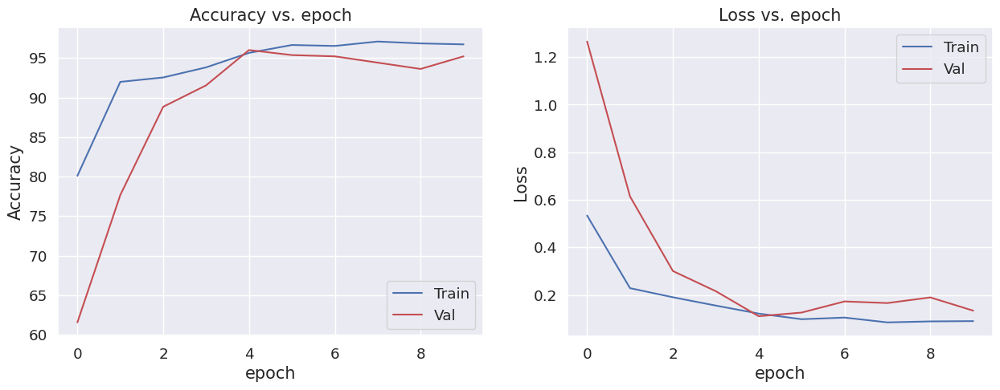

In [61]:
# Evaluating MobileNet_model
plot_acc_loss(history_4)

In [62]:
classwise_accuracy(noise_path, 'indian market', MobileNet_model)
classwise_accuracy(onion_path, 'onion', MobileNet_model)
classwise_accuracy(potato_path, 'potato', MobileNet_model)
classwise_accuracy(tomato_path, 'tomato', MobileNet_model)

Accuracy for class indian market is 71.6% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 86.42% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


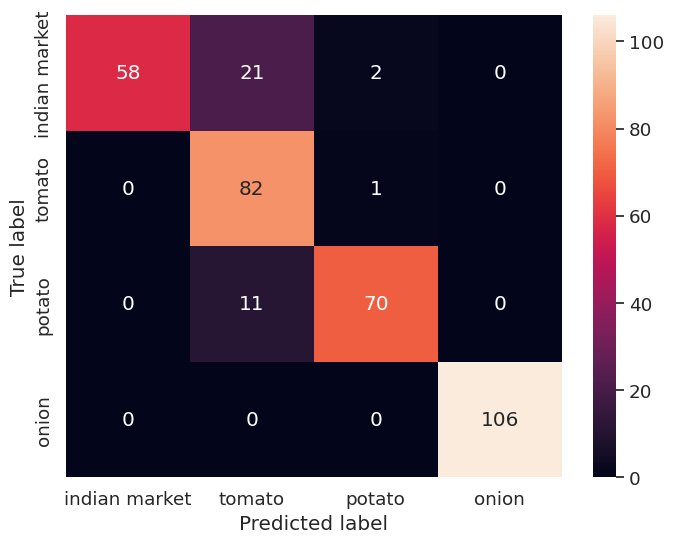

In [63]:
# ConfusionMatrix
l1 = []
l2 = []
l3 = []
l4 = []

ConfusionMatrix(noise_path, l1, MobileNet_model)
ConfusionMatrix(onion_path, l2, MobileNet_model)
ConfusionMatrix(potato_path, l3, MobileNet_model)
ConfusionMatrix(tomato_path, l4, MobileNet_model)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [64]:
result = MobileNet_model.evaluate(test_ds)
dict(zip(MobileNet_model.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 894ms/step - acc: 0.8426 - loss: 0.5046 - precision: 0.8537 - recall: 0.8330


{'loss': 0.2984393537044525, 'compile_metrics': 0.9002848863601685}

- We achieved  **train accuracy as 96% and test accuracy of 84%** on our finetuned MobileNet Model.

## **Models Comparison:**

### **Summary of Trained models:**


| Model | Test Acc| Train Acc
| --- | --- | ---|
| Custom CNN | 70% | 80% |
| CNN Revamp |  83%| 87% |
| VGG19 | 90% | 95% |
| ResNet101 | 29% | 98% |
| MobileNet | 84% | 96% |

<br>

- After training all of our Models, we found VGG19 to be the most accurate model on our Dataset.

- Let's visualize all of our models via tensorboard from the logs we created during training.

- We observed that ResNet101 gave us the highest test accuracy and our baseline CNN gave us the lowest accuracy.

In [65]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# **Testing our best model(VGG19):**

- VGG19 achieved the highest accuracy of **95%** among all the models we trained.

- Let's test our Finetuned VGG19 to predict on some random unseen data to visualize how accurate it is !

In [78]:
VGG19_model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg19 (Functional)              │ (None, 8, 8, 512)      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 60,079,310 (229.18 MB)

 Trainable params: 20,026,436 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 40,052,874 (152.79 MB)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


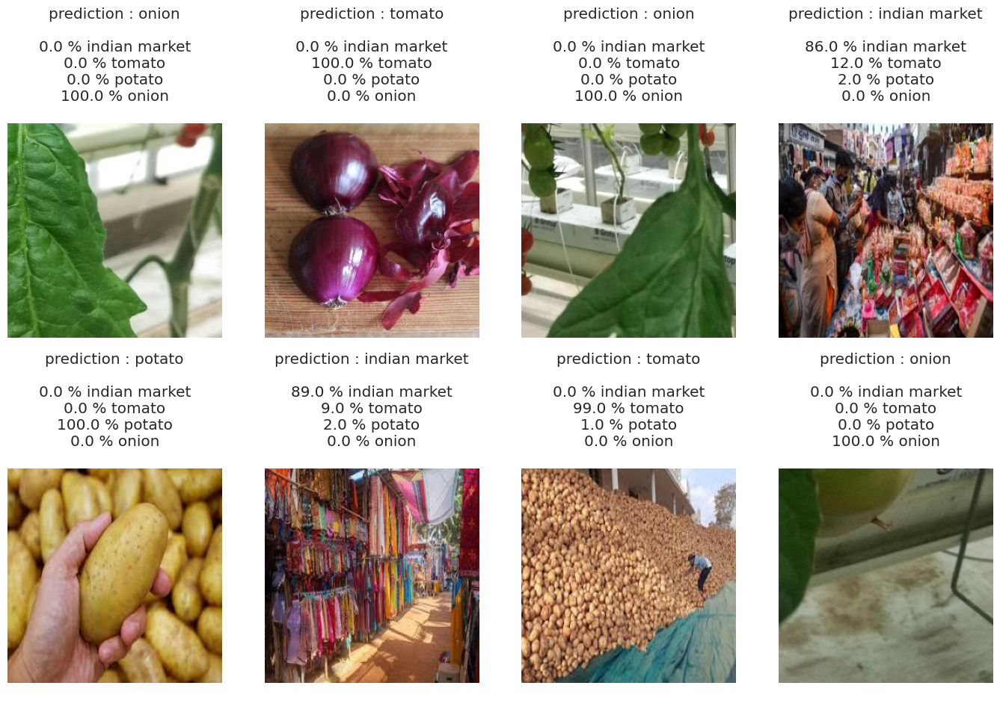

In [79]:
grid_test_model(VGG19_model)

We see that our Model is **nearly 100%** sure of the correct class in every image we plotted above,
<br>indicating a very good choice for our classfication task.

In [81]:
result = VGG19_model.evaluate(test_ds)
dict(zip(VGG19_model.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 492ms/step - acc: 0.8845 - loss: 0.4651 - precision: 0.8914 - recall: 0.8760


{'loss': 0.318578839302063, 'compile_metrics': 0.9088318943977356}

# **Summary:**
- This project focused on building and evaluating deep learning models to analyze Ninjacart's data to develop a multiclass image classification model that can accurately identify onions, potatoes, tomatoes and noise.
- Several architectures were explored, including a custom CNN, VGG16, MobileNet, and ResNet101.
- After rigorous training and validation, **VGG19** emerged as the best-performing model, achieving an **accuracy of 95%** and outperforming all other candidates in key metrics such as precision, recall.Its deep architecture and residual learning capability allowed it to capture complex patterns in the dataset, making it highly effective for our use case.


# **Insights:**
- VGG19 performed the best among all models for agricultural produce images and supply chain data from Ninjacart. Its deep, structured architecture provided high accuracy and stable training, making it well-suited for the complexity of the dataset.

- While MobileNet trained faster and had lower inference time, it could not match VGG19’s accuracy. ResNet101, despite its residual connections and ability to handle vanishing gradients, also performed slightly worse than VGG19.

- These results show that for real-world agricultural data, VGG19 is the most reliable choice when accuracy is more important than speed or model size.